In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import arviz as az

import sys, importlib
from FetchModel import FetchModel
from PostPred import PostPred
importlib.reload(sys.modules['FetchModel'])
importlib.reload(sys.modules['PostPred'])
from FetchModel import FetchModel
from PostPred import PostPred

# 180

In [45]:
Y = pd.read_csv("../Datasets/Dataset_180.csv")
Y['Count_180'] = pd.to_numeric(Y['Count_180']).astype('Int64')
X = pd.read_csv("../Datasets/variables_to_select.csv")

In [46]:
idx_obs = Y[Y['Count_180'].notna()].index
idx_miss = Y[Y['Count_180'].isna()].index

# take XX% of the remaining indexes for a test set
XX = 0.3 # [0, 1] change this value to change the size of the test set
idx_test = sorted(np.random.choice(idx_obs.values, int(XX*len(idx_obs)), replace=False))
idx_miss = sorted(np.concatenate((idx_test, idx_miss.values)))
idx_obs = sorted(np.setdiff1d(idx_obs, idx_test))

Y_obs = Y.loc[idx_obs, :].reset_index(drop=True)
Y_miss = Y.loc[idx_miss, :].reset_index(drop=True)

X_obs = X.loc[idx_obs, :].reset_index(drop=True)
X_miss = X.loc[idx_miss, :].reset_index(drop=True)

In [47]:
stations = Y['idSensore']
years = pd.Series(Y['Year'] - 2009)
months = pd.Series(Y['Month'] - 3)
unique_values = sorted(set(stations))
mapping_dict = {value: index + 1 for index, value in enumerate(unique_values)}
transformed_stations = [mapping_dict[value] for value in stations]
stations_original = pd.Series(stations)
stations = pd.Series(transformed_stations)

stations_obs = stations.loc[idx_obs].reset_index(drop=True)
stations_miss = stations.loc[idx_miss].reset_index(drop=True)
years_obs = years.loc[idx_obs].reset_index(drop=True)
years_miss = years.loc[idx_miss].reset_index(drop=True)
months_obs = months.loc[idx_obs].reset_index(drop=True)
months_miss = months.loc[idx_miss].reset_index(drop=True)


day_in_month = [31,28,31,30,31,30,31,31,30,31,30,31]

max_month = [day_in_month[Y['Month'][i]-1] for i in range(0,Y.shape[0]) ]

max_month = pd.Series(max_month)
max_month_obs = max_month.loc[idx_obs].reset_index(drop=True)
max_month_miss = max_month.loc[idx_miss].reset_index(drop=True)

In [48]:
phi = 63
distances = pd.read_csv("../Datasets/distances.csv", index_col=0)

In [49]:
data_180 = {
    "N": len(Y_obs),
    "N_miss": len(Y_miss),

    "y": Y_obs['Count_180'],
    "P": X_obs.shape[1],

    "nyears": 13,
    "nstations": 45,
    "nmonths": 7,

    "station": stations_obs,
    "year": years_obs,
    "max_month": max_month_obs,
    "station_miss": stations_miss,
    "year_miss": years_miss,
    "max_month_miss": max_month_miss,

    "X": X_obs,
    "X_miss": X_miss,

    "phi": phi,
    "distances": distances,

    "month": months_obs,
    "month_miss": months_miss
}

In [50]:
Models_180_df = pd.DataFrame(columns = ['WAIC', 'LOO', 'MSE', 'MAE', 'MAD', 'inside CI', 'MSE test', 'MAE test', 'MAD test', 'inside CI test'])

In [51]:
bin_logit = FetchModel('bin_logit').compile()

In [52]:
bin_logit_180 = bin_logit.sample(data=data_180, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_logit_180 = az.from_cmdstanpy(bin_logit_180)

19:36:04 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

19:56:46 - cmdstanpy - INFO - CmdStan done processing.
19:56:46 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_logit.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


19:56:55 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 iterations at max treedepth (0.2%)
	Chain 2 had 1 iterations at max treedepth (0.1%)
	Chain 3 had 4 iterations at max treedepth (0.4%)
	Chain 4 had 2 iterations at max treedepth (0.2%)
	Use function "diagnose()" to see further information.


In [53]:
post_pred = PostPred(posterior_bin_logit_180, Y['Count_180'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

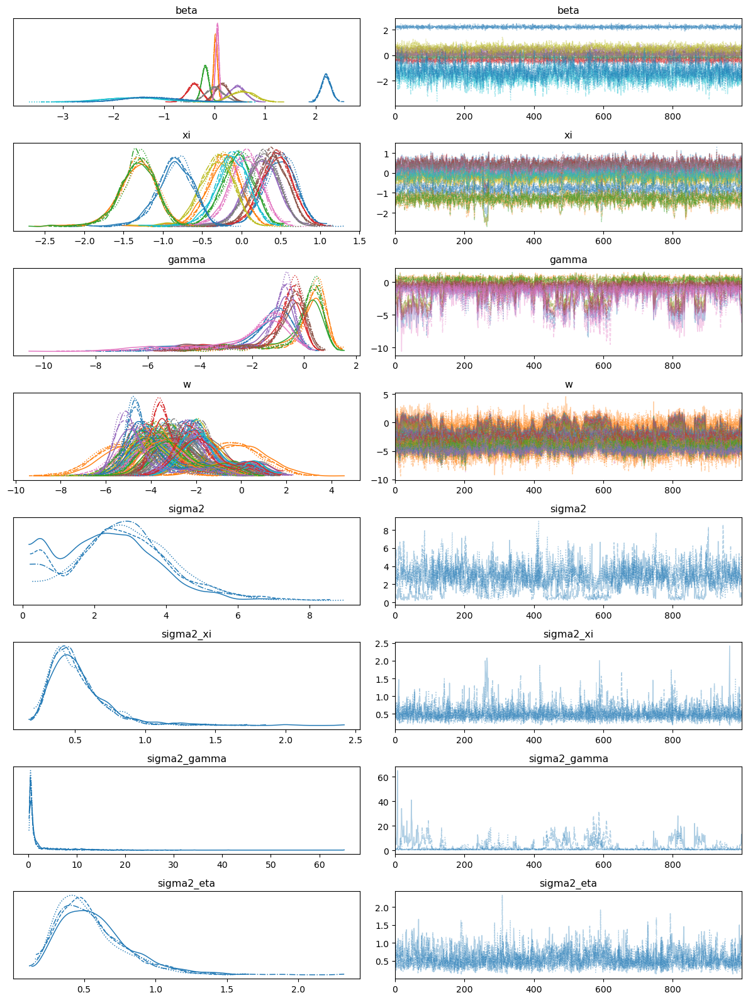

In [54]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [55]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

c:\Users\matte\anaconda3\envs\stan\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -2562.45    71.34
p_waic      116.91        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -2563.40    71.39
p_loo      117.87        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2662   99.8%
 (0.5, 0.7]   (ok)          4    0.2%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [56]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [57]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 137

The total number of outliers in the test set is: 54

The MSE is: 2.0346638655462184

The MAE is: 0.6935399159663865

The MAD is: 0.0

The MSE in the test set is: 2.3279334500875657

The MAE in the test set is: 0.7732049036777583

The MAD in the test set is: 0.0

The percentage of observations inside the CI is: 0.9640231092436975

The percentage of observations inside the CI of the test is: 0.9527145359019265



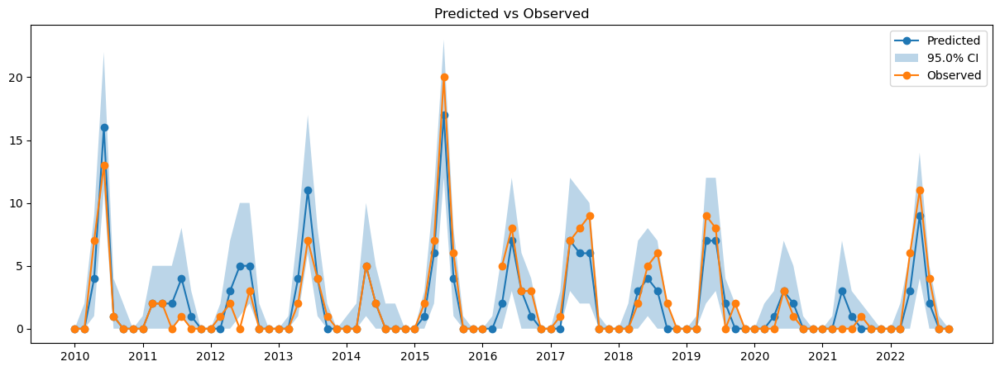

In [58]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [59]:
Models_180_df.loc['logit',:] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_180_df)

              WAIC          LOO       MSE      MAE  MAD inside CI  MSE test  \
logit -2562.445206 -2563.403324  2.034664  0.69354  0.0  0.964023  2.327933   

       MAE test MAD test inside CI test  
logit  0.773205      0.0       0.952715  


In [60]:
bin_probit = FetchModel('bin_probit').compile()

In [61]:
bin_probit_180 = bin_probit.sample(data=data_180, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_probit_180 = az.from_cmdstanpy(bin_probit_180)

19:58:00 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:16:42 - cmdstanpy - INFO - CmdStan done processing.
20:16:42 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True 

20:16:51 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 iterations at max treedepth (0.1%)
	Chain 2 had 3 iterations at max treedepth (0.3%)
	Chain 4 had 2 iterations at max treedepth (0.2%)
	Use function "diagnose()" to see further information.


In [62]:
post_pred = PostPred(posterior_bin_probit_180, Y['Count_180'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

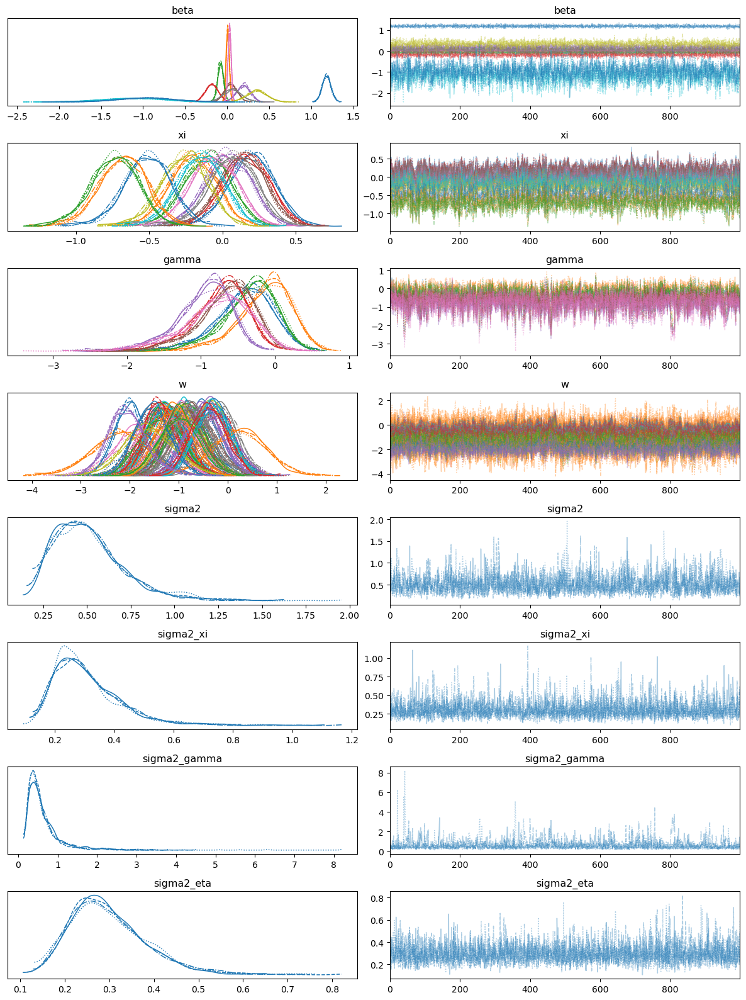

In [63]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [64]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

c:\Users\matte\anaconda3\envs\stan\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -2544.83    73.07
p_waic      118.07        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -2545.74    73.12
p_loo      118.98        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2658   99.7%
 (0.5, 0.7]   (ok)          8    0.3%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [65]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [66]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 141

The total number of outliers in the test set is: 57

The MSE is: 2.03577993697479

The MAE is: 0.6931460084033614

The MAD is: 0.0

The MSE in the test set is: 2.36077057793345

The MAE in the test set is: 0.7793345008756567

The MAD in the test set is: 0.0

The percentage of observations inside the CI is: 0.9629726890756303

The percentage of observations inside the CI of the test is: 0.9500875656742557



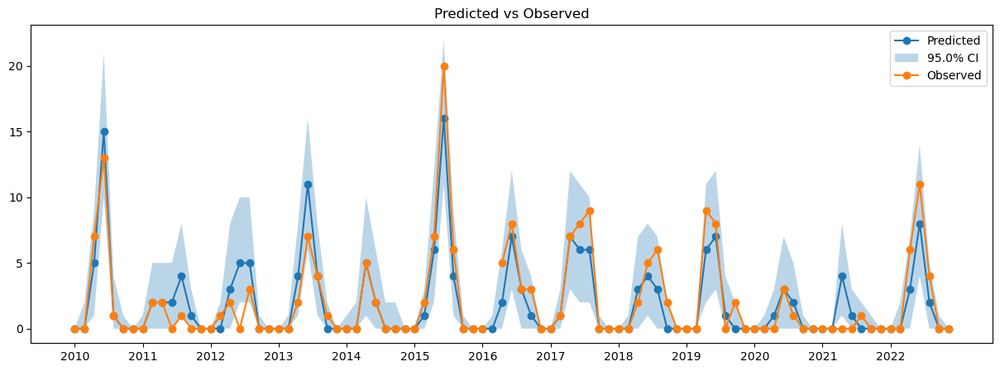

In [67]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [68]:
Models_180_df.loc['probit', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_180_df)

               WAIC          LOO       MSE       MAE  MAD inside CI  MSE test  \
logit  -2562.445206 -2563.403324  2.034664   0.69354  0.0  0.964023  2.327933   
probit -2544.834713 -2545.744543   2.03578  0.693146  0.0  0.962973  2.360771   

        MAE test MAD test inside CI test  
logit   0.773205      0.0       0.952715  
probit  0.779335      0.0       0.950088  


In [69]:
bin_logit_var = FetchModel('bin_logit_var').compile()

In [70]:
bin_logit_var_180 = bin_logit_var.sample(data=data_180, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_logit_var_180 = az.from_cmdstanpy(bin_logit_var_180)

20:17:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

20:27:32 - cmdstanpy - INFO - CmdStan done processing.
20:27:32 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: Matrix m is not positive definite (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_logit_var.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_logit_var.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


In [71]:
post_pred = PostPred(posterior_bin_logit_var_180, Y['Count_180'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

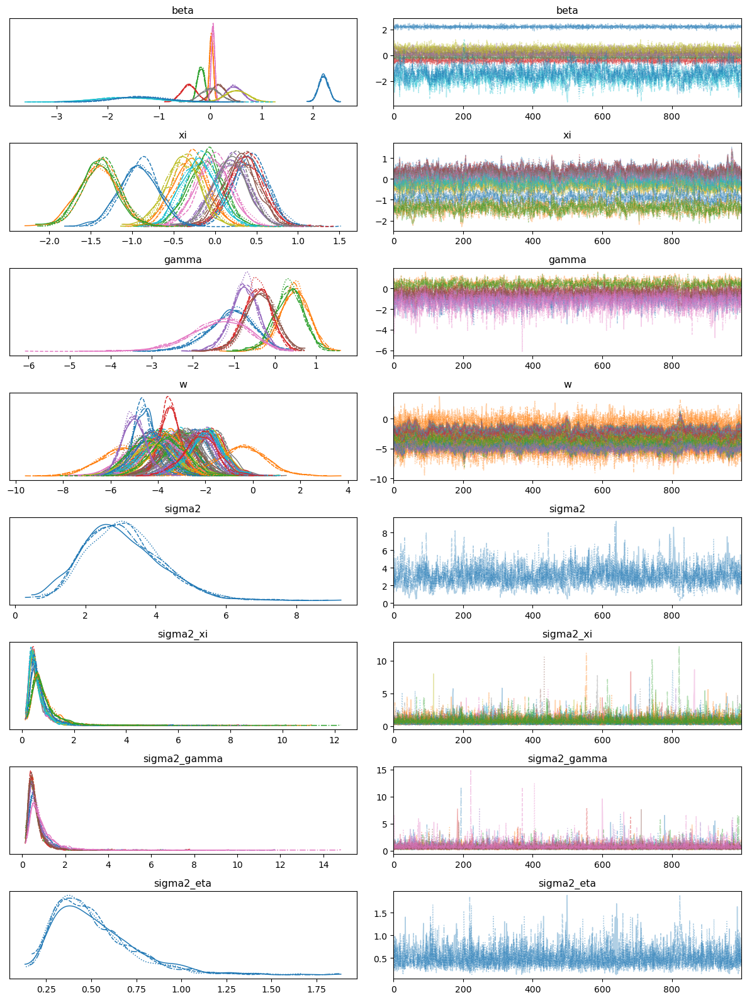

In [72]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [73]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

c:\Users\matte\anaconda3\envs\stan\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -2562.43    71.35
p_waic      116.96        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -2563.32    71.39
p_loo      117.84        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2660   99.8%
 (0.5, 0.7]   (ok)          6    0.2%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [74]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [75]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 138

The total number of outliers in the test set is: 54

The MSE is: 2.031643907563025

The MAE is: 0.6914390756302521

The MAD is: 0.0

The MSE in the test set is: 2.331217162872154

The MAE in the test set is: 0.7736427320490368

The MAD in the test set is: 0.0

The percentage of observations inside the CI is: 0.9637605042016807

The percentage of observations inside the CI of the test is: 0.9527145359019265



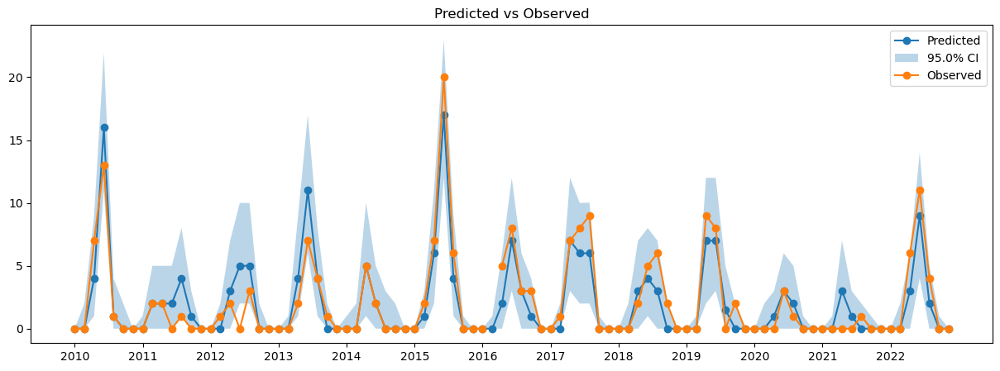

In [76]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [77]:
Models_180_df.loc['logit var', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_180_df)

                  WAIC          LOO       MSE       MAE  MAD inside CI  \
logit     -2562.445206 -2563.403324  2.034664   0.69354  0.0  0.964023   
probit    -2544.834713 -2545.744543   2.03578  0.693146  0.0  0.962973   
logit var -2562.431989  -2563.31624  2.031644  0.691439  0.0  0.963761   

           MSE test  MAE test MAD test inside CI test  
logit      2.327933  0.773205      0.0       0.952715  
probit     2.360771  0.779335      0.0       0.950088  
logit var  2.331217  0.773643      0.0       0.952715  


In [80]:
bin_probit_var = FetchModel('bin_probit_var').compile()

In [81]:
bin_probit_var_180 = bin_probit_var.sample(data=data_180, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_probit_var_180 = az.from_cmdstanpy(bin_probit_var_180)

21:08:28 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

21:26:14 - cmdstanpy - INFO - CmdStan done processing.
21:26:14 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: Matrix m is not positive definite (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit_var.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit_var.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit_var.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


In [82]:
post_pred = PostPred(posterior_bin_probit_var_180, Y['Count_180'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

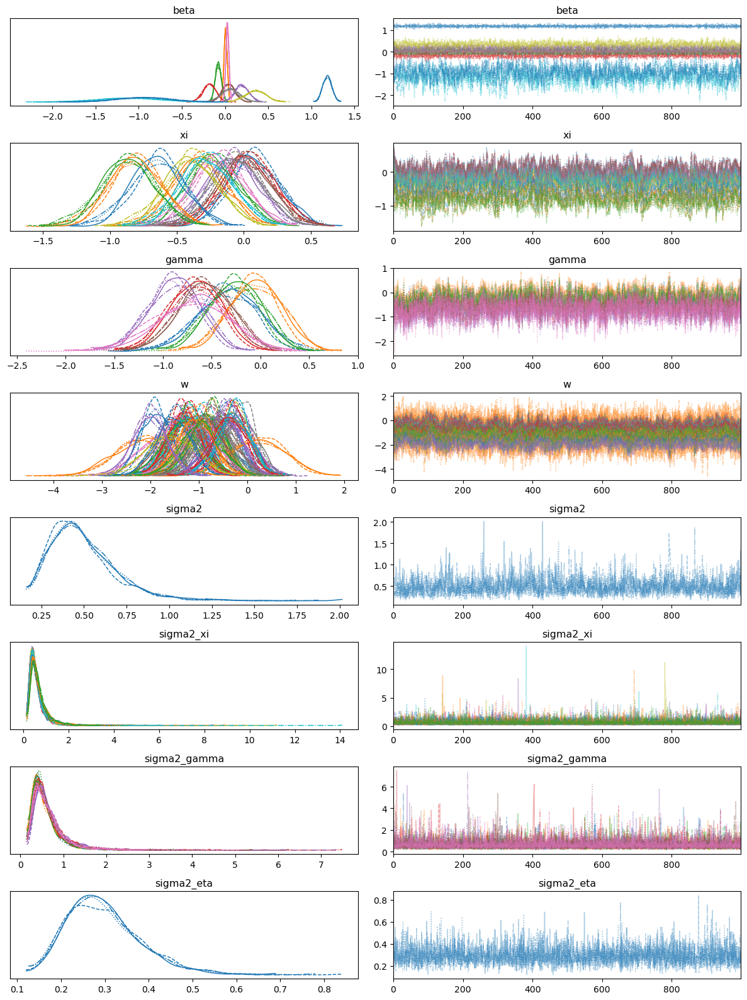

In [83]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [84]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

c:\Users\matte\anaconda3\envs\stan\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
c:\Users\matte\anaconda3\envs\stan\Lib\site-packages\arviz\stats\stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -2545.69    73.19
p_waic      119.09        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2666 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -2546.65    73.24
p_loo      120.06        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2664   99.9%
 (0.5, 0.7]   (ok)          1    0.0%
   (0.7, 1]   (bad)         1    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [85]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [86]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 142

The total number of outliers in the test set is: 57

The MSE is: 2.032169117647059

The MAE is: 0.6919642857142857

The MAD is: 0.0

The MSE in the test set is: 2.3677758318739053

The MAE in the test set is: 0.7810858143607706

The MAD in the test set is: 0.0

The percentage of observations inside the CI is: 0.9627100840336135

The percentage of observations inside the CI of the test is: 0.9500875656742557



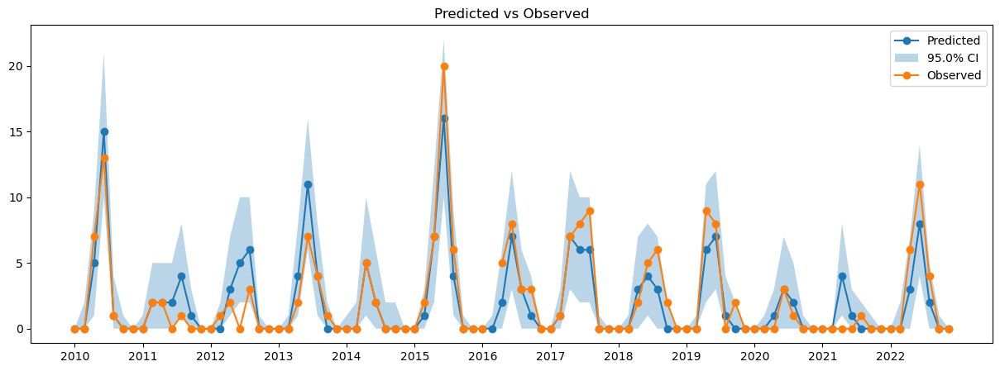

In [87]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [88]:
Models_180_df.loc['probit var', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_180_df)

                   WAIC          LOO       MSE       MAE  MAD inside CI  \
logit      -2562.445206 -2563.403324  2.034664   0.69354  0.0  0.964023   
probit     -2544.834713 -2545.744543   2.03578  0.693146  0.0  0.962973   
logit var  -2562.431989  -2563.31624  2.031644  0.691439  0.0  0.963761   
probit var  -2545.68572 -2546.652382  2.032169  0.691964  0.0   0.96271   

            MSE test  MAE test MAD test inside CI test  
logit       2.327933  0.773205      0.0       0.952715  
probit      2.360771  0.779335      0.0       0.950088  
logit var   2.331217  0.773643      0.0       0.952715  
probit var  2.367776  0.781086      0.0       0.950088  


# 120

In [2]:
Y = pd.read_csv("../Datasets/Dataset_120.csv")
Y['Count_120'] = pd.to_numeric(Y['Count_120']).astype('Int64')
X = pd.read_csv("../Datasets/variables_to_select.csv")

In [3]:
idx_obs = Y[Y['Count_120'].notna()].index
idx_miss = Y[Y['Count_120'].isna()].index

# take XX% of the remaining indexes for a test set
XX = 0.3 # [0, 1] change this value to change the size of the test set
idx_test = sorted(np.random.choice(idx_obs.values, int(XX*len(idx_obs)), replace=False))
idx_miss = sorted(np.concatenate((idx_test, idx_miss.values)))
idx_obs = sorted(np.setdiff1d(idx_obs, idx_test))

Y_obs = Y.loc[idx_obs, :].reset_index(drop=True)
Y_miss = Y.loc[idx_miss, :].reset_index(drop=True)

X_obs = X.loc[idx_obs, :].reset_index(drop=True)
X_miss = X.loc[idx_miss, :].reset_index(drop=True)

In [4]:
stations = Y['idSensore']
years = pd.Series(Y['Year'] - 2009)
months = pd.Series(Y['Month'] - 3)
unique_values = sorted(set(stations))
mapping_dict = {value: index + 1 for index, value in enumerate(unique_values)}
transformed_stations = [mapping_dict[value] for value in stations]
stations_original = pd.Series(stations)
stations = pd.Series(transformed_stations)

stations_obs = stations.loc[idx_obs].reset_index(drop=True)
stations_miss = stations.loc[idx_miss].reset_index(drop=True)
years_obs = years.loc[idx_obs].reset_index(drop=True)
years_miss = years.loc[idx_miss].reset_index(drop=True)
months_obs = months.loc[idx_obs].reset_index(drop=True)
months_miss = months.loc[idx_miss].reset_index(drop=True)


day_in_month = [31,28,31,30,31,30,31,31,30,31,30,31]

max_month = [day_in_month[Y['Month'][i]-1] for i in range(0,Y.shape[0]) ]

max_month = pd.Series(max_month)
max_month_obs = max_month.loc[idx_obs].reset_index(drop=True)
max_month_miss = max_month.loc[idx_miss].reset_index(drop=True)

In [5]:
phi = 63
distances = pd.read_csv("../Datasets/distances.csv", index_col=0)

In [6]:
data_120 = {
    "N": len(Y_obs),
    "N_miss": len(Y_miss),

    "y": Y_obs['Count_120'],
    "P": X_obs.shape[1],

    "nyears": 13,
    "nstations": 45,
    "nmonths": 7,

    "station": stations_obs,
    "year": years_obs,
    "max_month": max_month_obs,
    "station_miss": stations_miss,
    "year_miss": years_miss,
    "max_month_miss": max_month_miss,

    "X": X_obs,
    "X_miss": X_miss,

    "phi": phi,
    "distances": distances,

    "month": months_obs,
    "month_miss": months_miss
}

In [7]:
Models_120_df = pd.DataFrame(columns = ['WAIC', 'LOO', 'MSE', 'MAE', 'MAD', 'inside CI', 'MSE test', 'MAE test', 'MAD test', 'inside CI test'])

In [8]:
bin_logit = FetchModel('bin_logit').compile()

In [9]:
bin_logit_120 = bin_logit.sample(data=data_120, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_logit_120 = az.from_cmdstanpy(bin_logit_120)

17:53:57 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

18:09:58 - cmdstanpy - INFO - CmdStan done processing.
18:09:58 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_lpdf: Scale parameter is 0, but must be positive! (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_logit.stan', line 74, column 2 to column 34)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_logit.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


18:10:08 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 3 had 1 iterations at max treedepth (0.1%)
	Chain 4 had 1 iterations at max treedepth (0.1%)
	Use function "diagnose()" to see further information.


In [10]:
post_pred = PostPred(posterior_bin_logit_120, Y['Count_120'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

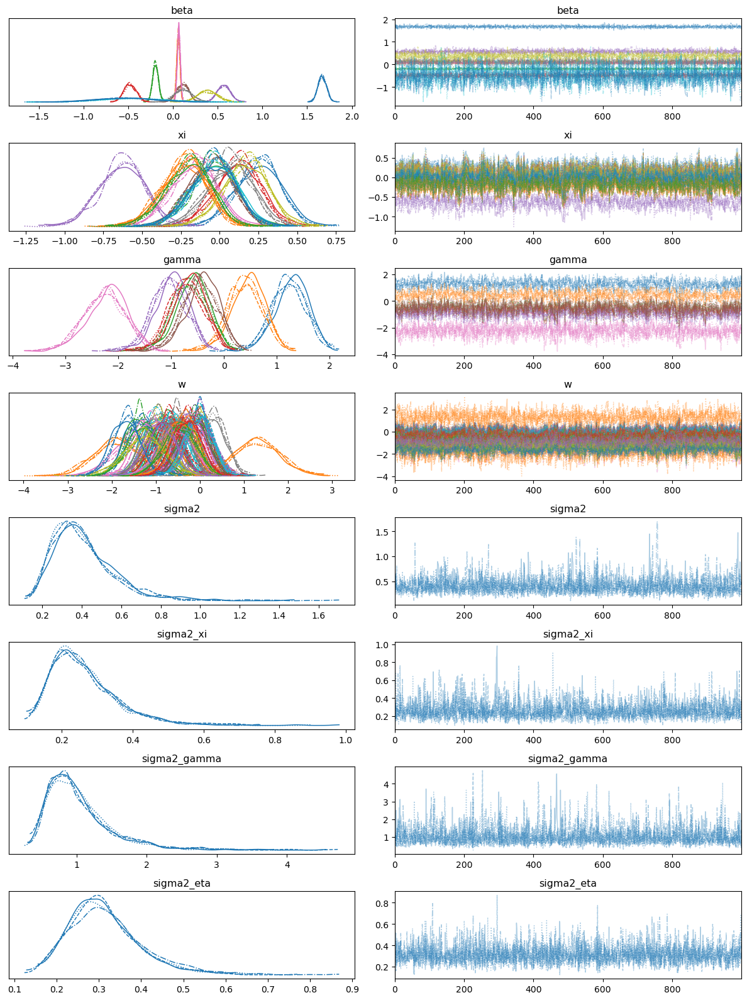

In [11]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [12]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

c:\Users\matte\anaconda3\envs\stan\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -6686.37   101.47
p_waic      163.44        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6686.82   101.49
p_loo      163.90        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2685   99.9%
 (0.5, 0.7]   (ok)          3    0.1%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [13]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [14]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 473

The total number of outliers in the test set is: 173

The MSE is: 10.346028645833334

The MAE is: 2.2993489583333333

The MAD is: 2.0

The MSE in the test set is: 10.721571180555555

The MAE in the test set is: 2.357204861111111

The MAD in the test set is: 2.0

The percentage of observations inside the CI is: 0.8768229166666667

The percentage of observations inside the CI of the test is: 0.8498263888888888



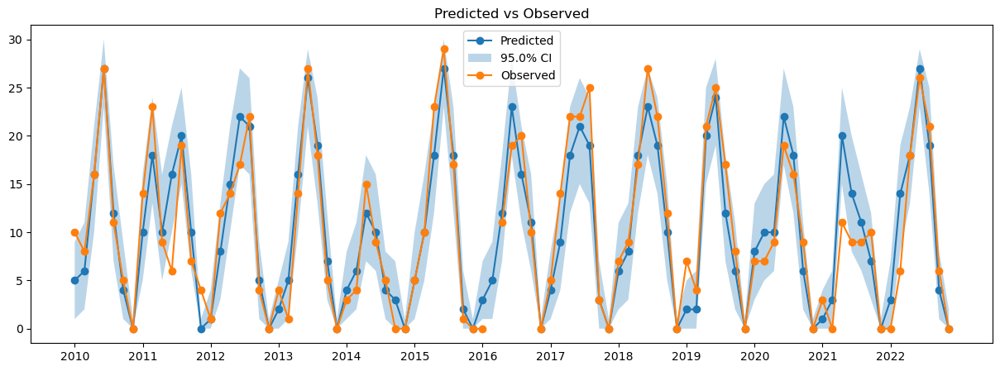

In [15]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [16]:
Models_120_df.loc['logit',:] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_120_df)

              WAIC          LOO        MSE       MAE  MAD inside CI  \
logit -6686.371771 -6686.824972  10.346029  2.299349  2.0  0.876823   

        MSE test  MAE test MAD test inside CI test  
logit  10.721571  2.357205      2.0       0.849826  


In [17]:
bin_probit = FetchModel('bin_probit').compile()

In [18]:
bin_probit_120 = bin_probit.sample(data=data_120, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_probit_120 = az.from_cmdstanpy(bin_probit_120)

18:11:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

18:32:55 - cmdstanpy - INFO - CmdStan done processing.
18:32:55 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


18:33:05 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 8 iterations at max treedepth (0.8%)
	Chain 2 had 4 iterations at max treedepth (0.4%)
	Chain 4 had 6 iterations at max treedepth (0.6%)
	Use function "diagnose()" to see further information.


In [19]:
post_pred = PostPred(posterior_bin_probit_120, Y['Count_120'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

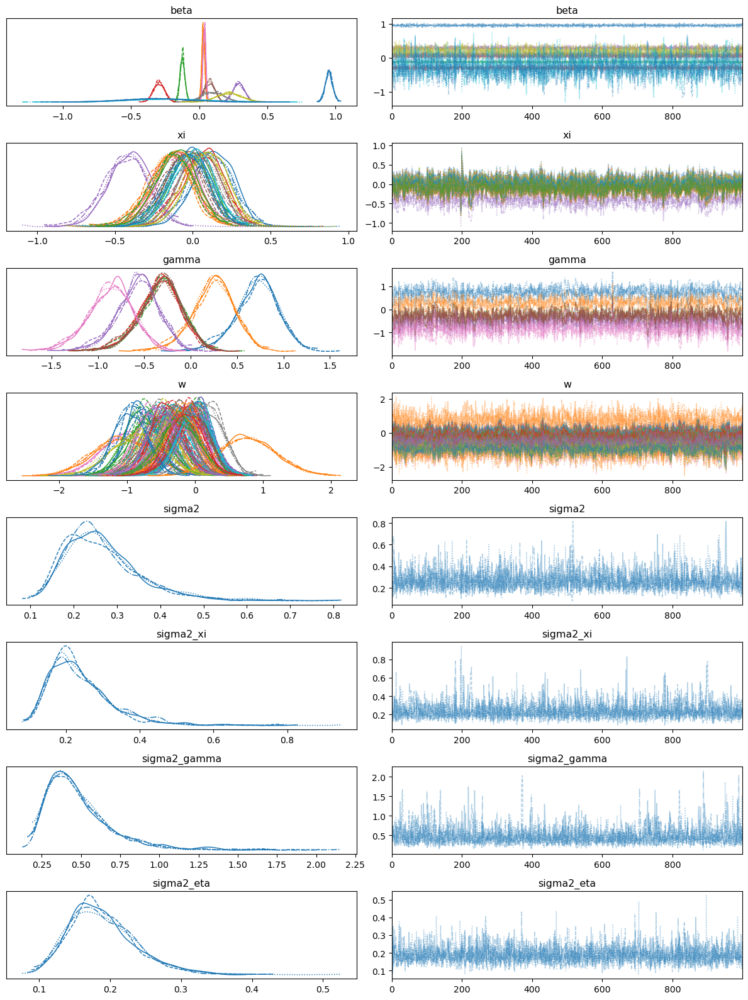

In [20]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [21]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

c:\Users\matte\anaconda3\envs\stan\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -6726.66   103.65
p_waic      167.89        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6727.02   103.66
p_loo      168.25        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2688  100.0%
 (0.5, 0.7]   (ok)          0    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [22]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [23]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 482

The total number of outliers in the test set is: 170

The MSE is: 10.496028645833333

The MAE is: 2.3194010416666666

The MAD is: 2.0

The MSE in the test set is: 10.96896701388889

The MAE in the test set is: 2.3997395833333335

The MAD in the test set is: 2.0

The percentage of observations inside the CI is: 0.8744791666666667

The percentage of observations inside the CI of the test is: 0.8524305555555556



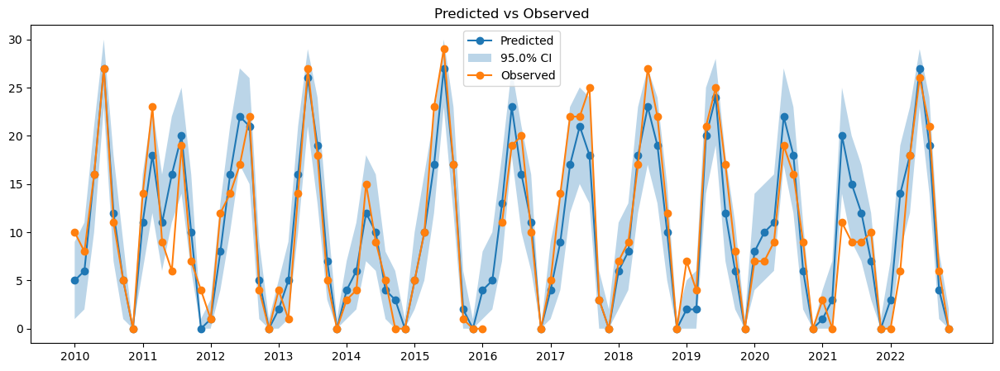

In [24]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [25]:
Models_120_df.loc['probit', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_120_df)

               WAIC          LOO        MSE       MAE  MAD inside CI  \
logit  -6686.371771 -6686.824972  10.346029  2.299349  2.0  0.876823   
probit  -6726.65714 -6727.017027  10.496029  2.319401  2.0  0.874479   

         MSE test  MAE test MAD test inside CI test  
logit   10.721571  2.357205      2.0       0.849826  
probit  10.968967   2.39974      2.0       0.852431  


In [26]:
bin_logit_var = FetchModel('bin_logit_var').compile()

In [27]:
bin_logit_var_120 = bin_logit_var.sample(data=data_120, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_logit_var_120 = az.from_cmdstanpy(bin_logit_var_120)

18:34:17 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

18:48:41 - cmdstanpy - INFO - CmdStan done processing.
18:48:41 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_logit_var.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


In [28]:
post_pred = PostPred(posterior_bin_logit_var_120, Y['Count_120'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

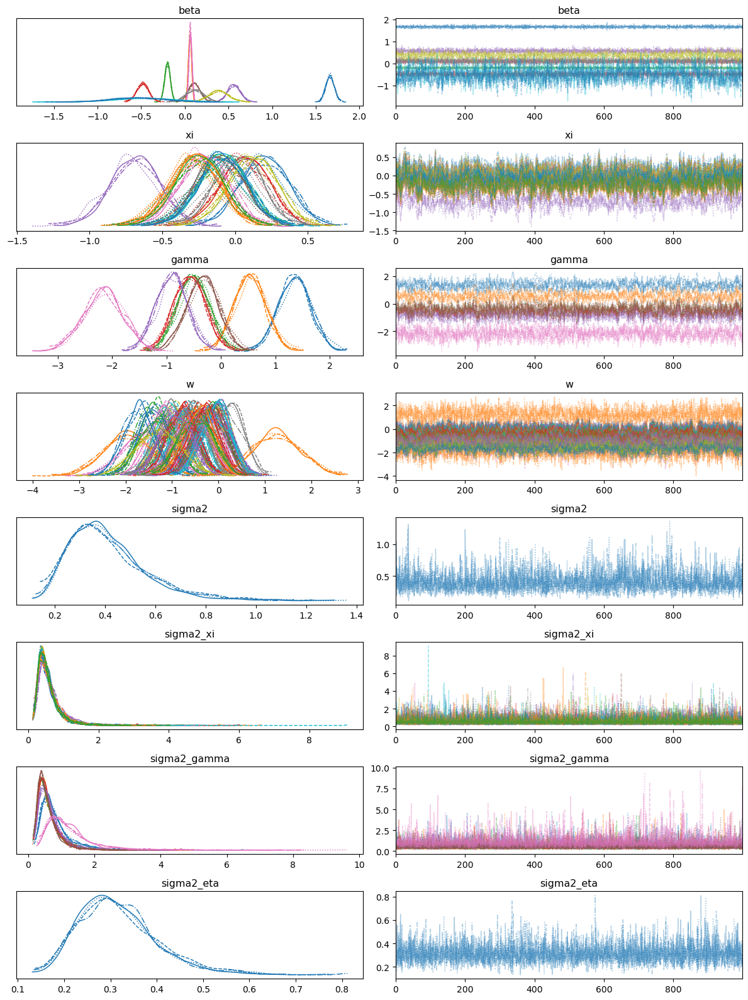

In [29]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [30]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

c:\Users\matte\anaconda3\envs\stan\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -6687.30   101.52
p_waic      164.76        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6687.69   101.53
p_loo      165.16        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2688  100.0%
 (0.5, 0.7]   (ok)          0    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [31]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [32]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 474

The total number of outliers in the test set is: 171

The MSE is: 10.329817708333334

The MAE is: 2.2981770833333335

The MAD is: 2.0

The MSE in the test set is: 10.717664930555555

The MAE in the test set is: 2.3589409722222223

The MAD in the test set is: 2.0

The percentage of observations inside the CI is: 0.8765625

The percentage of observations inside the CI of the test is: 0.8515625



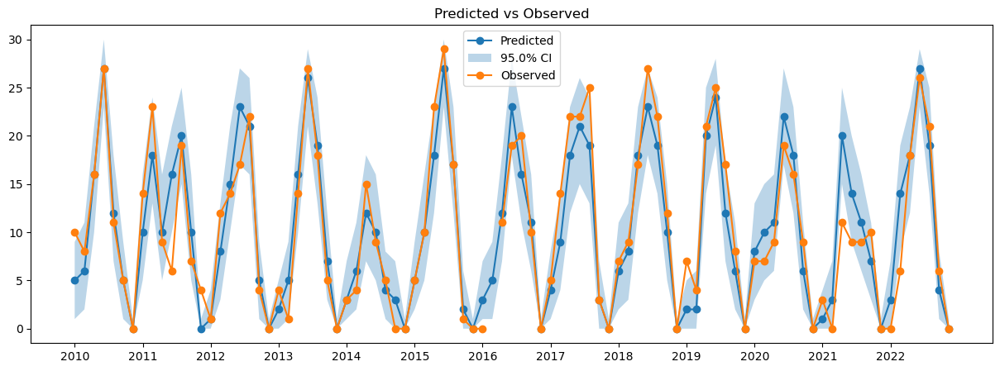

In [33]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [34]:
Models_120_df.loc['logit var', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_120_df)

                  WAIC          LOO        MSE       MAE  MAD inside CI  \
logit     -6686.371771 -6686.824972  10.346029  2.299349  2.0  0.876823   
probit     -6726.65714 -6727.017027  10.496029  2.319401  2.0  0.874479   
logit var -6687.296178 -6687.694892  10.329818  2.298177  2.0  0.876563   

            MSE test  MAE test MAD test inside CI test  
logit      10.721571  2.357205      2.0       0.849826  
probit     10.968967   2.39974      2.0       0.852431  
logit var  10.717665  2.358941      2.0       0.851562  


In [35]:
bin_probit_var = FetchModel('bin_probit_var').compile()

In [36]:
bin_probit_var_120 = bin_probit_var.sample(data=data_120, chains=4, parallel_chains=4, 
    iter_warmup=1000, iter_sampling=1000)
posterior_bin_probit_var_120 = az.from_cmdstanpy(bin_probit_var_120)

18:49:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

19:10:33 - cmdstanpy - INFO - CmdStan done processing.
19:10:33 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit_var.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: A is not symmetric. A[1,2] = nan, but A[2,1] = nan (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit_var.stan', line 53, column 2 to column 63)
Exception: cholesky_decompose: Matrix m is not positive definite (in 'C:/Users/matte/Desktop/Bayesian_Stat/Bayesian_Project/main/Modello/stan/bin_probit_var.stan', line 53, column 2 to column 63)
Consider re-running with show_console=True if the above output is unclear!


19:10:44 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 4 had 9 iterations at max treedepth (0.9%)
	Use function "diagnose()" to see further information.


In [37]:
post_pred = PostPred(posterior_bin_probit_var_120, Y['Count_120'], test_train=True, idx_test=idx_test)
Y_data = post_pred.Y
post_pred.posterior_az

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats

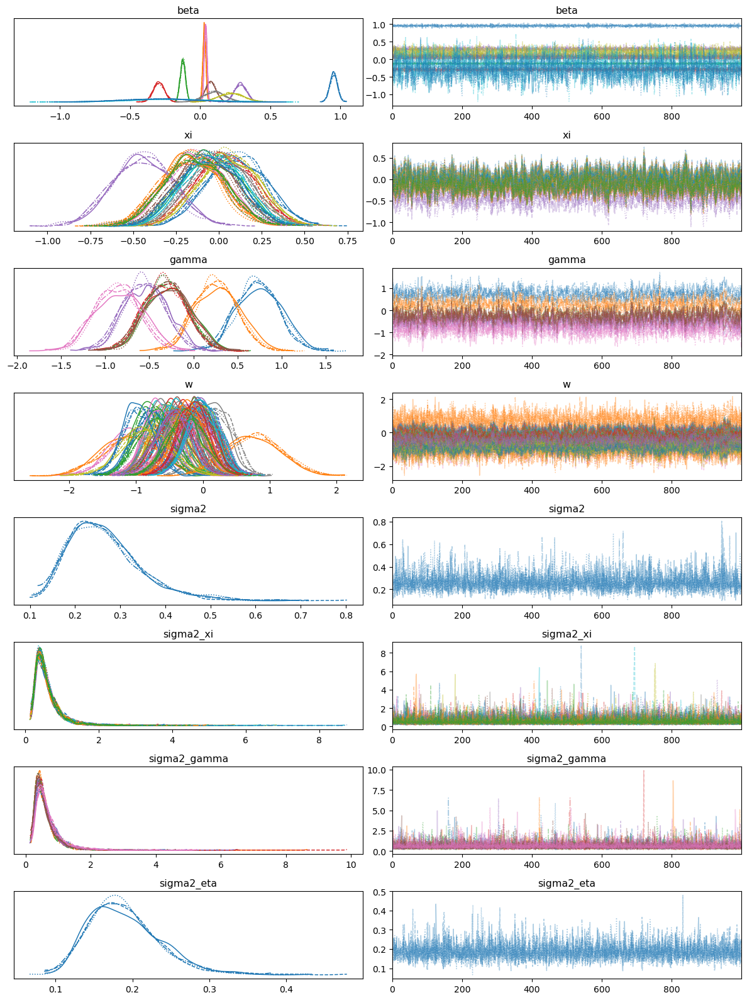

In [38]:
az.plot_trace(post_pred.posterior_az, var_names = ['beta', 'xi', 'gamma', 'w', 'sigma2', 'sigma2_xi', 'sigma2_gamma', 'sigma2_eta'])
plt.tight_layout()
plt.show()

In [39]:
waic_out = az.waic(post_pred.posterior_az, var_name='log_lik')
loo_out = az.loo(post_pred.posterior_az, var_name='log_lik')
waic = waic_out.elpd_waic
loo = loo_out.elpd_loo
print(waic_out)
print(loo_out)

c:\Users\matte\anaconda3\envs\stan\Lib\site-packages\arviz\stats\stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

          Estimate       SE
elpd_waic -6727.33   103.73
p_waic      168.88        -

There has been a warning during the calculation. Please check the results.
Computed from 4000 posterior samples and 2688 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -6727.68   103.74
p_loo      169.23        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     2688  100.0%
 (0.5, 0.7]   (ok)          0    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%



In [40]:
alpha = 0.05
y_pred, metrics = post_pred.predict(CI=True,
                                       alpha = alpha,
                                       error_metrics = True)

In [41]:
y_obs, residuals, mse, mae, mad, mse_test, mae_test, mad_test, outliers_test, percentage_inside_CI_test, outliers, percentage_inside = metrics.values()
print(f'The total number of outliers is: {len(outliers)}\n')
print(f'The total number of outliers in the test set is: {len(outliers_test)}\n')
print(f'The MSE is: {mse}\n')
print(f'The MAE is: {mae}\n')
print(f'The MAD is: {mad}\n')
print(f'The MSE in the test set is: {mse_test}\n')
print(f'The MAE in the test set is: {mae_test}\n')
print(f'The MAD in the test set is: {mad_test}\n')
print(f'The percentage of observations inside the CI is: {percentage_inside}\n')
print(f'The percentage of observations inside the CI of the test is: {percentage_inside_CI_test}\n')

The total number of outliers is: 472

The total number of outliers in the test set is: 168

The MSE is: 10.532682291666667

The MAE is: 2.3247395833333333

The MAD is: 2.0

The MSE in the test set is: 10.99609375

The MAE in the test set is: 2.4036458333333335

The MAD in the test set is: 2.0

The percentage of observations inside the CI is: 0.8770833333333333

The percentage of observations inside the CI of the test is: 0.8541666666666666



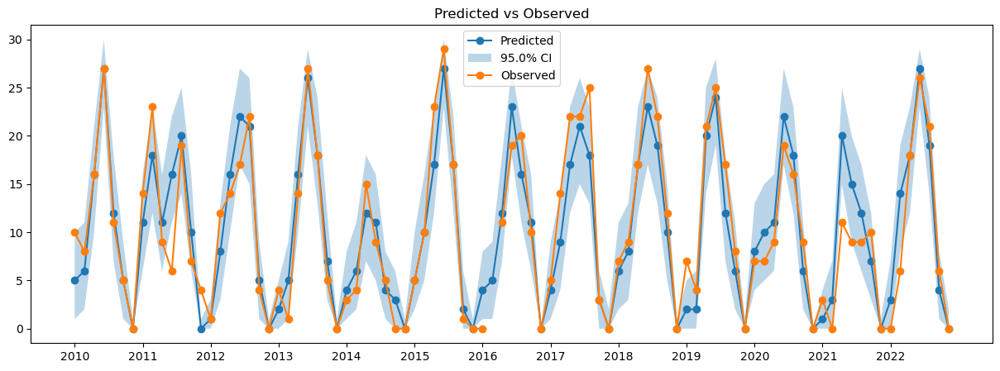

In [42]:
station_num_to_plot = 35 # Change this to plot a different station, -1 to plot manually
if station_num_to_plot != -1:
    xx = np.arange(13*7*(station_num_to_plot-1), 13*7*station_num_to_plot)
else:
    xx = np.arange(1000, 1200) # Change this for the range of the manual choice
plt.figure(figsize=(15, 5))
plt.plot(xx, y_pred.loc[xx, 'pred'], label='Predicted', linestyle='-', marker='o')
plt.fill_between(xx, y_pred.loc[xx, f'{alpha/2}'], y_pred.loc[xx, f'{(1-alpha/2)}'], alpha=0.3, label=f'{(1-alpha)*100}% CI')
plt.plot(xx, Y_data[xx], label='Observed', linestyle='-', marker='o')
plt.xticks(xx[np.arange(0,len(xx),7)], np.arange(2010,2023))
plt.legend()
plt.title('Predicted vs Observed')
plt.show()

In [43]:
Models_120_df.loc['probit var', :] = [waic, loo, mse, mae, mad, percentage_inside, mse_test, mae_test, mad_test, percentage_inside_CI_test]
print(Models_120_df)

                   WAIC          LOO        MSE       MAE  MAD inside CI  \
logit      -6686.371771 -6686.824972  10.346029  2.299349  2.0  0.876823   
probit      -6726.65714 -6727.017027  10.496029  2.319401  2.0  0.874479   
logit var  -6687.296178 -6687.694892  10.329818  2.298177  2.0  0.876563   
probit var -6727.330244 -6727.683793  10.532682   2.32474  2.0  0.877083   

             MSE test  MAE test MAD test inside CI test  
logit       10.721571  2.357205      2.0       0.849826  
probit      10.968967   2.39974      2.0       0.852431  
logit var   10.717665  2.358941      2.0       0.851562  
probit var  10.996094  2.403646      2.0       0.854167  
